In [35]:
import numpy as np
import matplotlib.pylab as plt
def graph(name):
    # Determinar dimensiones de la malla
    data = np.loadtxt(f"../data/{name}", skiprows=3)
    X = data[:,2]
    Y = data[:,3]
    U = data[:,4]#.reshape(5,5)
    V = data[:,5]#.reshape(5,5)
    P = data[:,6]#.reshape(5,5)
    XY = np.meshgrid(X,Y)


    nx = len(np.unique(X))
    ny = len(np.unique(Y))

    # Redimensionar arrays
    X_grid = X.reshape(ny, nx)
    Y_grid = Y.reshape(ny, nx)
    U_grid = U.reshape(ny, nx)
    V_grid = V.reshape(ny, nx)
    P_grid = P.reshape(ny, nx)

    # Crear figura combinada
    plt.figure(figsize=(8, 6))

    # Mapa de contorno de presión
    contour = plt.contourf(X_grid, Y_grid, P_grid, cmap='viridis')
    plt.colorbar(contour, label='Presión P')

    # Superponer campo vectorial de velocidades
    plt.quiver(X_grid, Y_grid, U_grid*5, V_grid*5, color='black', scale=100)

    # Etiquetas y formato
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.title('Presión y Campo de Velocidades')
    plt.axis('equal')
    plt.tight_layout()
    plt.grid(True)
    plt.savefig(f"../images/{name}.png")
    plt.show()

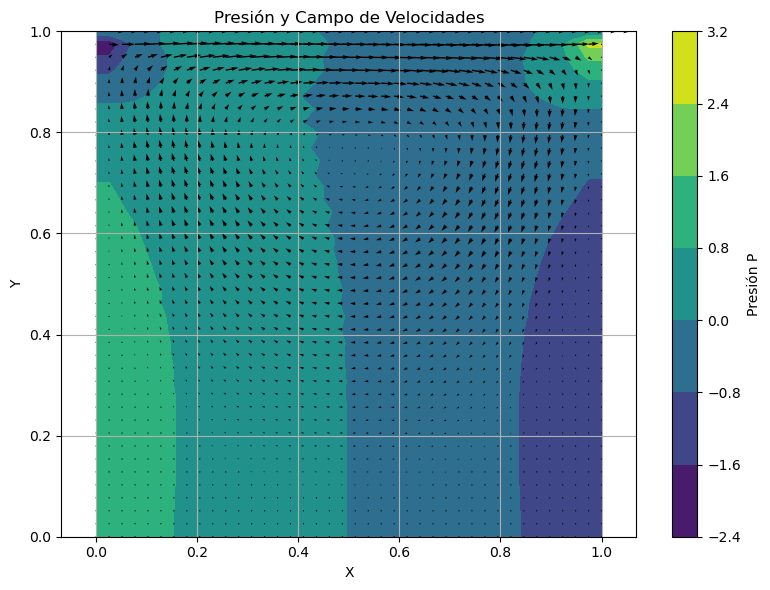

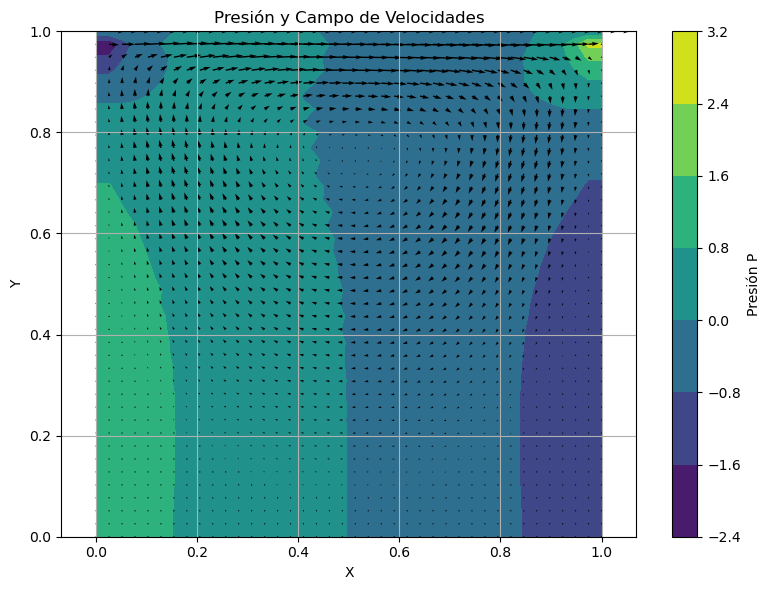

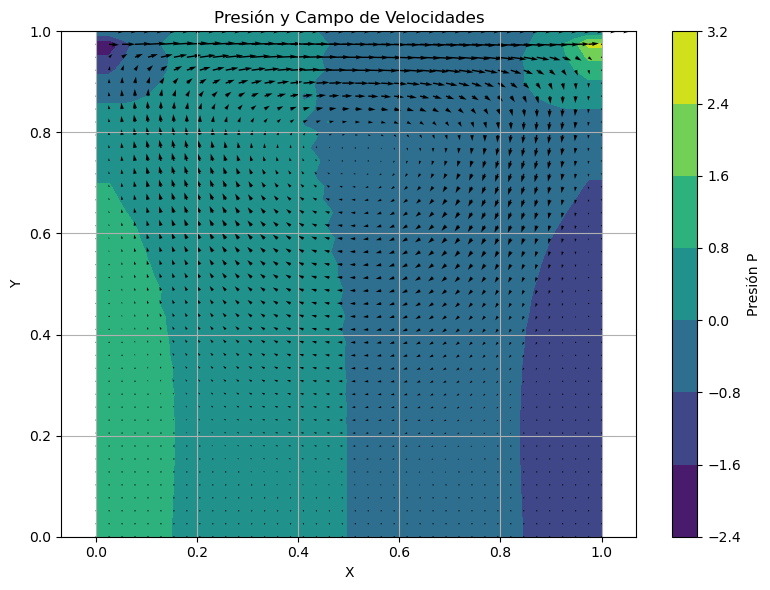

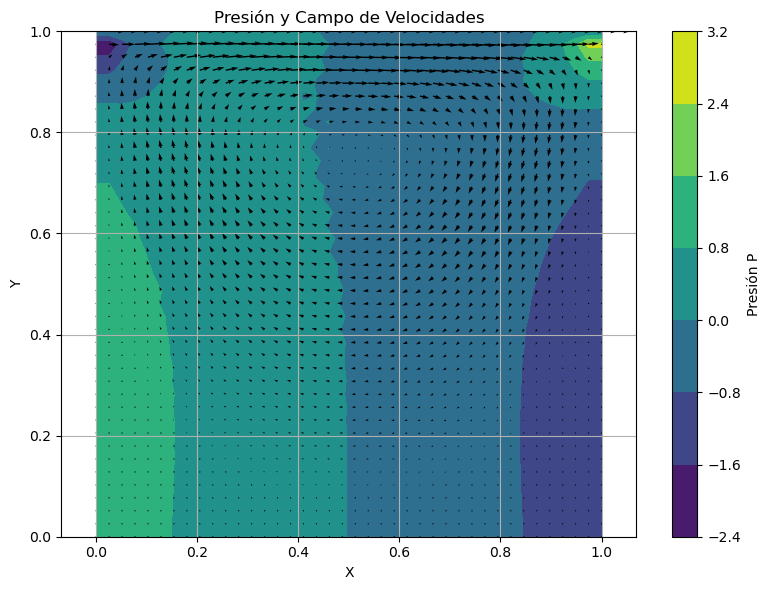

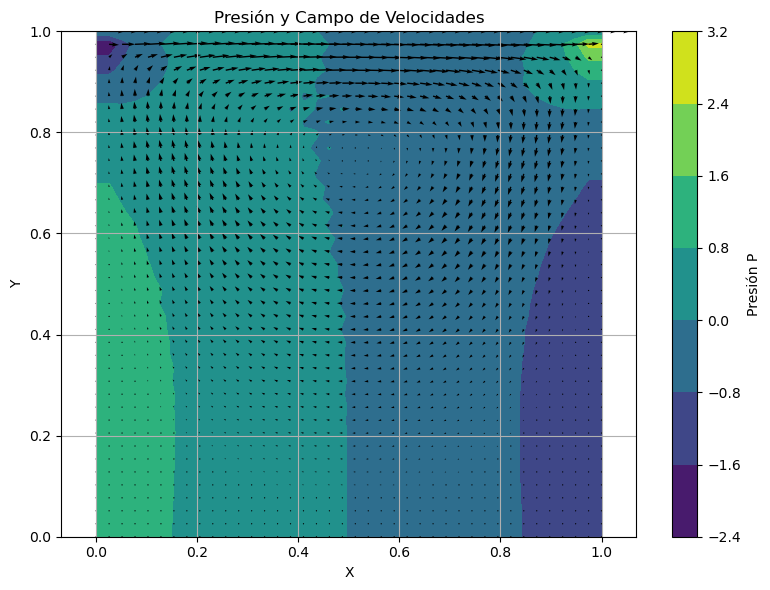

...

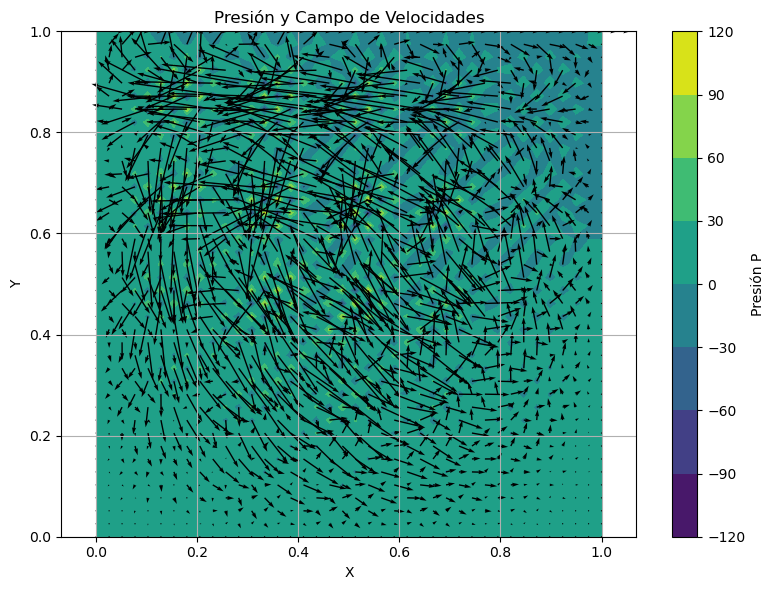

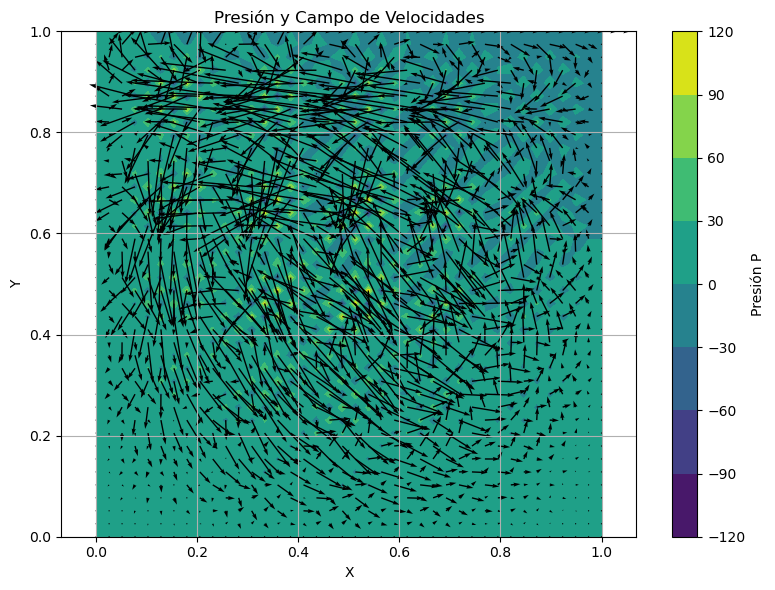

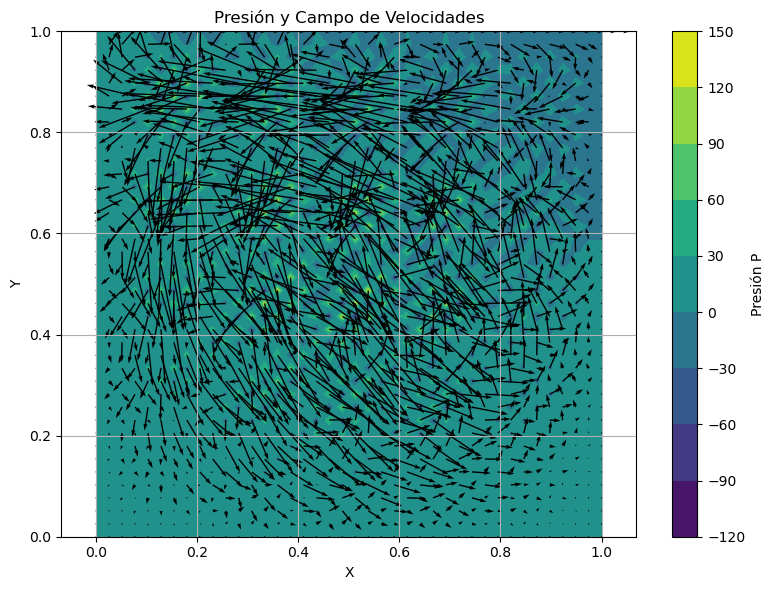

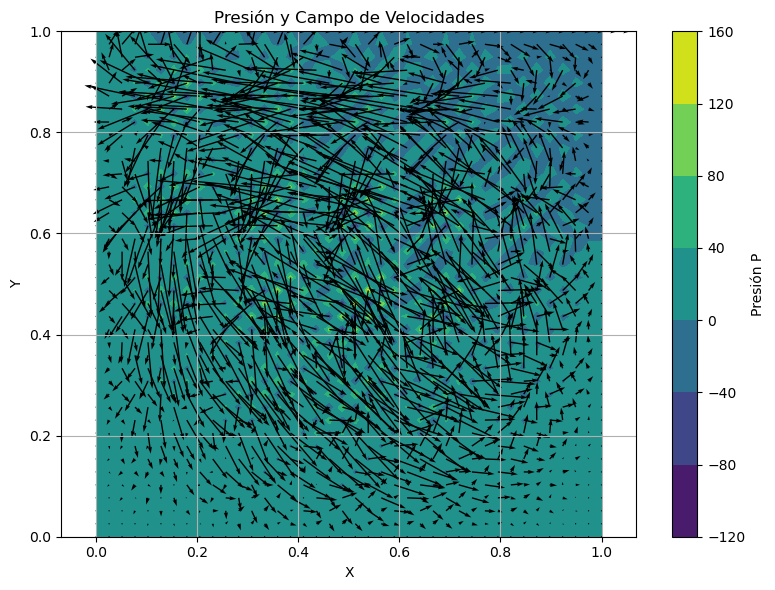

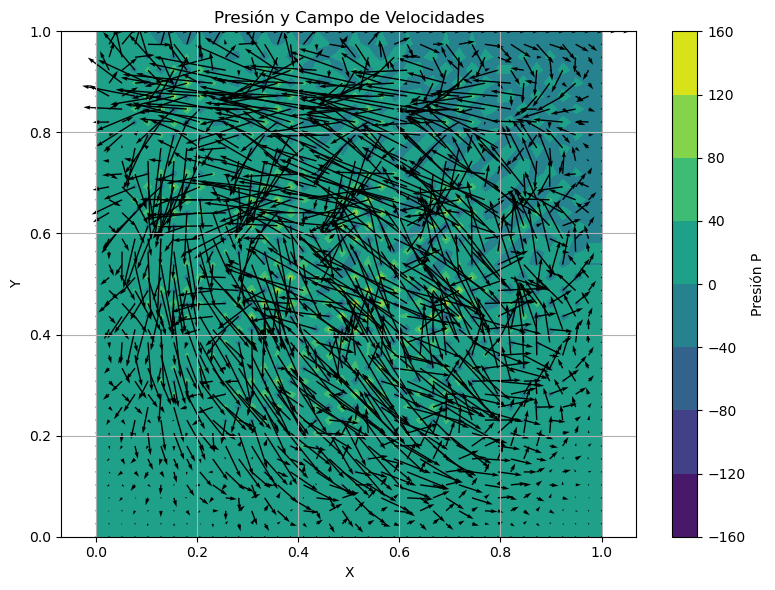

In [36]:
file_names = [f"campos_{i:03}.txt" for i in range(710, 1500, 10)]
for f in file_names:
    graph(f)

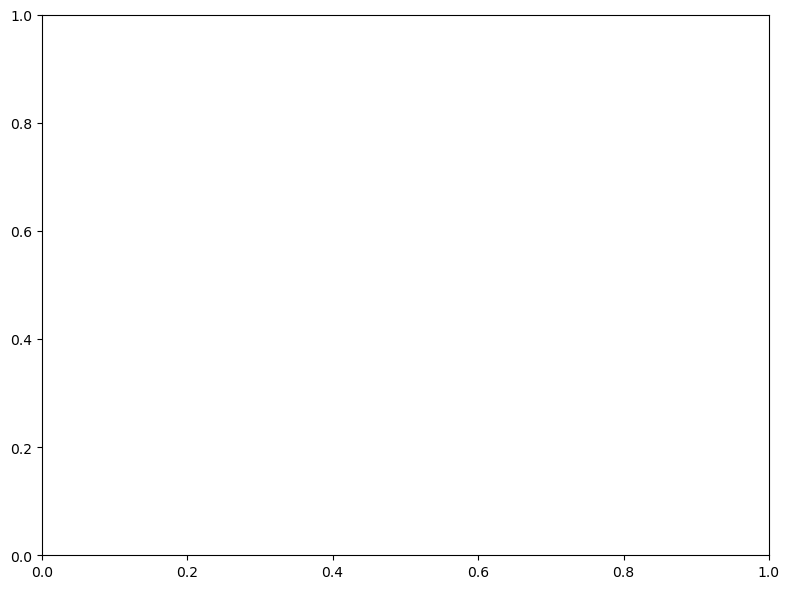

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import os
import glob

# Ruta base de los archivos
data_dir = "../data"

# Obtener todos los archivos .txt y ordenarlos numéricamente
file_paths = sorted(glob.glob(os.path.join(data_dir, 'campos_*.txt')), 
                    key=lambda x: int(os.path.basename(x).split('_')[1].split('.')[0]))

# Verifica si se encontraron archivos
if not file_paths:
    print("No se encontraron archivos de datos en la carpeta '../data/'.")
    print("Asegúrate de haber ejecutado el programa C++ (`make run`) y de que los archivos se estén guardando en la ubicación correcta.")
else:
    # Cargar la primera para extraer la grilla
    data = np.loadtxt(file_paths[0], skiprows=3)
    X = data[:, 2]
    Y = data[:, 3]
    nx = len(np.unique(X))
    ny = len(np.unique(Y))
    X_grid = X.reshape(ny, nx)
    Y_grid = Y.reshape(ny, nx)

    # Crear figura
    fig, ax = plt.subplots(figsize=(8, 6))
    contourf = None
    quiver = None

    # Inicialización de la animación
    def init():
        global contourf, quiver
        ax.clear()
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_title('Presión y Campo de Velocidades')
        ax.set_aspect('equal')
        ax.grid(True)
        return []

    # Función de actualización para cada frame
    def update(frame_index):
        global contourf, quiver
        ax.clear()

        # Cargar archivo correspondiente
        data = np.loadtxt(file_paths[frame_index], skiprows=3)
        X = data[:, 2]
        Y = data[:, 3]
        U = data[:, 4]
        V = data[:, 5]
        P = data[:, 6]

        X_grid = X.reshape(ny, nx)
        Y_grid = Y.reshape(ny, nx)
        U_grid = U.reshape(ny, nx)
        V_grid = V.reshape(ny, nx)
        P_grid = P.reshape(ny, nx)

        # Dibujar contorno y campo de velocidad
        contourf = ax.contourf(X_grid, Y_grid, P_grid, cmap='viridis')
        quiver = ax.quiver(X_grid, Y_grid, U_grid, V_grid, color='black', scale=10)

        # El título ahora muestra el nombre del archivo para verificar
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_title(f'Frame: {os.path.basename(file_paths[frame_index])}')
        ax.set_aspect('equal')
        ax.grid(True)

    # Crear animación
    ani = animation.FuncAnimation(
        fig, update, frames=len(file_paths), init_func=init, blit=False, interval=200
    )

    # Mostrar animación
    plt.tight_layout()
    plt.show()

In [38]:
# Guardar como gif opcional:
ani.save('animacion.gif', writer='imageio', fps=10)

MovieWriter imageio unavailable; using Pillow instead.
